# Similarity Search

In this part of the notebook, we compute the molecular fingerprints of our compounds. Afterwards, we identify the compounds with the highest similarity to our control using the euclidean distance of both the morphological and molecular fingerprints.

##  Import libraries and previous data

In [1]:

import pickle

import numpy as np
import pandas as pd
import plotly_express as px
from scipy.spatial import distance
from rdkit import Chem
from rdkit.Chem import rdFingerprintGenerator, Draw
from rdkit.Chem.MolStandardize import rdMolStandardize


### Load data : per-treatment profile

The file loaded contains the normalized, aggregated profile per treatment compound. <br>
Data is stored under : _z_score_agreg.pkl_

In [2]:
path_to_pickle_file ='../data/z_score_agreg.pkl'
z_score_agreg = pickle.load(open(path_to_pickle_file, 'rb'))

z_score_agreg.head(2)

,Metadata_broad_sample,CPD_NAME,CPD_SMILES,Cells_AreaShape_Area,Cells_AreaShape_Center_X,Cells_AreaShape_Center_Y,Cells_AreaShape_Compactness,Cells_AreaShape_Extent,Cells_AreaShape_FormFactor,Cells_AreaShape_MajorAxisLength,...,Nuclei_Texture_SumEntropy_DNA_3_0,Nuclei_Texture_SumEntropy_Mito_10_0,Nuclei_Texture_SumEntropy_RNA_10_0,Nuclei_Texture_SumEntropy_RNA_3_0,Nuclei_Texture_SumVariance_AGP_10_0,Nuclei_Texture_SumVariance_ER_10_0,Nuclei_Texture_Variance_AGP_10_0,Nuclei_Texture_Variance_ER_10_0,Nuclei_Texture_Variance_Mito_10_0,Nuclei_Texture_Variance_RNA_10_0
0,BRD-K08693008-001-01-9,BRD-K08693008,OC[C@@H]1O[C@@H](CCn2cc(nn2)C2CCCCC2)CC[C@@H]1...,0.071990,2.241229,0.995284,2.384573,-2.233921,-0.757944,0.425989,...,2.442456,-1.391897,-1.613503,-1.072081,3.012114,0.749913,2.351233,1.170176,-0.774194,-1.615324
1,BRD-K63982890-001-01-9,BRD-K63982890,OC[C@@H]1O[C@@H](CCn2cc(nn2)C2CCCCC2)CC[C@H]1N...,-0.670867,1.411121,0.147575,1.100819,-1.362762,-1.413523,-0.322607,...,2.850531,-2.452677,-1.088209,-1.269022,0.669270,0.981757,0.497282,0.272964,-1.796194,-2.594994


For this  part the DMSO profile won't be necessary so for it not to appear within the similarity search we will extract the profile from the datagrame

In [3]:
DMSO = z_score_agreg.loc[z_score_agreg['CPD_NAME'] == 'DMSO']
z_score_agreg.drop(DMSO.index,inplace=True)
z_score_agreg.reset_index(drop=True,inplace=True)

In [4]:
morpho_profile = z_score_agreg.copy(deep=True)

In [5]:
morpho_profile[morpho_profile['CPD_NAME']=='propranolol']['Metadata_broad_sample']

22408    BRD-A10070317-003-05-1
23178    BRD-K13994703-001-02-0
27229    BRD-K92830582-003-04-8
Name: Metadata_broad_sample, dtype: object

## Molecular Fingerprints 

1. Pre-processing SMILES

> *to-do :* Pre-processing molecular fingerprint aims to clean the smiles, un-charge them and get Inchi key value to obtain standardized smiles _cite_ or _link to teach open cadd notebook_



Here is a Notebook on how to use the rdMolStandardize module in Rdkit : [Standardization Smile ](https://github.com/rdkit/rdkit/blob/master/Docs/Notebooks/MolStandardize.ipynb)

In [6]:
def clean_std_smiles(dataset):
    
    '''
    Standardize (Cleanup) and canonicalize parent smiles
        Parameters : 
            dataset (data frame): data frame having a column named 'CPD_SMILES' with smiles
        Returns : 
            dataset (data frame): same data frame with one more column named 'STD_smile'
    '''
    
    object = dataset['CPD_SMILES'].apply(Chem.MolFromSmiles)
    #Standardizes the molecule list
    clean_mol = [rdMolStandardize.Cleanup(mol) for mol in object ] 
    #Returns the largest fragment after doing a cleanup
    parent_clean_mol = [rdMolStandardize.FragmentParent(mol) for mol in clean_mol] 

    try : inchi = [Chem.MolToInchi(mol) for mol in parent_clean_mol]
    except : print(f'cannot convert this smile into Inchi' )
    
    std_smile = list(map(Chem.MolFromInchi,inchi))
    smile = list(map(Chem.MolToSmiles,std_smile))
    #smile = list(map(Chem.MolToSmiles,parent_clean_mol))
    dataset['STD_smile'] = smile

    return dataset

In [7]:
profiles = clean_std_smiles(z_score_agreg)

[17:47:40] Initializing MetalDisconnector
[17:47:40] Running MetalDisconnector
[17:47:40] Initializing Normalizer
[17:47:40] Running Normalizer
[17:47:40] Initializing MetalDisconnector
[17:47:40] Running MetalDisconnector
[17:47:40] Initializing Normalizer
[17:47:40] Running Normalizer
[17:47:40] Initializing MetalDisconnector
[17:47:40] Running MetalDisconnector
[17:47:40] Initializing Normalizer
[17:47:40] Running Normalizer
[17:47:40] Initializing MetalDisconnector
[17:47:40] Running MetalDisconnector
[17:47:40] Initializing Normalizer
[17:47:40] Running Normalizer
[17:47:40] Initializing MetalDisconnector
[17:47:40] Running MetalDisconnector
[17:47:40] Initializing Normalizer
[17:47:40] Running Normalizer
[17:47:40] Initializing MetalDisconnector
[17:47:40] Running MetalDisconnector
[17:47:40] Initializing Normalizer
[17:47:40] Running Normalizer
[17:47:40] Initializing MetalDisconnector
[17:47:40] Running MetalDisconnector
[17:47:40] Initializing Normalizer
[17:47:40] Running Nor

Now the dataframe profiles contains a column with standardized and canonical smiles

2. Convert smiles to Morgan fingerprint

> Morgan fingeprint explanation _teach open cadd notebook_

Explanation of the next 3 step 

In [8]:
def morgan_bin(fpg,dataset):
    
    '''
    Generate Morgan fingerprints as binary vector  
        Parameters : 
            fpg (object): rdFingerprintGenerator(radius=X,fpSize=X) object generated by make_fps()
            dataset (data frame): data frame having a column named 'STD_smile' with smiles
        Returns : 
            dataset (data frame): same data frame with one more column named 'morganB_fps' within a list
    '''     
    
    circular_bit_fp = [fpg.GetFingerprint(Chem.MolFromSmiles(smiles)).ToList() for smiles in dataset['STD_smile']]
    dataset['morganB_fps'] =  circular_bit_fp
    
    return dataset

def fps_table(data,colname_fps):
    
    '''
    Generate fingerprint table 
        Parameters : 
            data (data frame): data frame having a column named 'STD_smile' with smiles
            colname_fps (str): identical name of fps created beforehand (morganI_fps,morganB_fps)
        Returns : 
            fingerprint_table (data frame): data frame of size = len of a fingerprint, each column = an element of the fps 
    '''     
    
    fps_name = colname_fps.split('_')[0]
    fingerprint_arr = fps_name   + '_fps_array'
    fingerprint_table = fps_name + '_table'
    collection = fingerprint_arr + '_collection'  
    
    fps = data[colname_fps]
    fingerprint_arr  = np.stack(fps)
    
    collection = []
    for x in np.arange(fingerprint_arr.shape[1]): 
        x = fps_name+'fp'+str(x)
        collection.append(x)
    fingerprint_table = pd.DataFrame(fingerprint_arr  , columns = collection )
    
    cpd = data['CPD_NAME']
    
    fingerprint_table.insert(0, column = 'CPD_NAME', value = cpd)
    return fingerprint_table

def make_fps(dataset,val_radius=2,n_bits=1024):
    
    '''
    Make fingerprints is the function call to create molecular fingerprints, combine morphological fingerprints etc 
        Parameters : 
            dataset_profiles (data frame): initial dataset having the morphological profiles  
            val_radius (int):  default = 2 can be changed, used to make morgan fingerprint cf GetMorganGenerator() Rdkit function 
            n_bits (int): default = 1024 can be changed, used to make morgan fingerprint cf GetMorganGenerator() Rdkit function 
        Returns : 
            dataset (data frame): initial dataset with a supplementary column containing the newly generated fps -> to drop before running make_models for a different fps 
            fps_frame  (data frame): molecular fingerprint data frame 
    ''' 
    fpg = rdFingerprintGenerator.GetMorganGenerator(radius=val_radius, fpSize=n_bits)


    dataset = morgan_bin(fpg,dataset)
    fps_frame = fps_table(dataset,'morganB_fps')

    return dataset, fps_frame

Now we can call the above function and  generate morgan fingerprint dataframe 

In [9]:
morgan_bin_ds, morgan_bin_frame = make_fps(dataset = profiles)

[17:48:42] WARNING: not removing hydrogen atom without neighbors
[17:48:42] WARNING: not removing hydrogen atom without neighbors


## Hands-on: Similarity search

For similarity search we will select a query , molecule for wich we want to identified other similar compound in both the chemical and morphlogical library 

1. Define a query

In [10]:
query_name = 'progesterone'
profiles[profiles['CPD_NAME'] == query_name ]

,Metadata_broad_sample,CPD_NAME,CPD_SMILES,Cells_AreaShape_Area,Cells_AreaShape_Center_X,Cells_AreaShape_Center_Y,Cells_AreaShape_Compactness,Cells_AreaShape_Extent,Cells_AreaShape_FormFactor,Cells_AreaShape_MajorAxisLength,...,Nuclei_Texture_SumEntropy_RNA_10_0,Nuclei_Texture_SumEntropy_RNA_3_0,Nuclei_Texture_SumVariance_AGP_10_0,Nuclei_Texture_SumVariance_ER_10_0,Nuclei_Texture_Variance_AGP_10_0,Nuclei_Texture_Variance_ER_10_0,Nuclei_Texture_Variance_Mito_10_0,Nuclei_Texture_Variance_RNA_10_0,STD_smile,morganB_fps
23964,BRD-K64994968-001-03-6,progesterone,CC(=O)[C@H]1CC[C@H]2[C@@H]3CCC4=CC(=O)CC[C@]4(...,0.216272,-0.332781,1.019365,0.726984,-0.43749,-0.021523,0.237587,...,-0.119176,-0.708486,-0.616499,-0.648562,-0.520343,0.065579,-0.717303,-0.552898,CC(=O)[C@H]1CC[C@H]2[C@@H]3CCC4=CC(=O)CC[C@]4(...,"[0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, ..."


In [11]:
idx_ref = profiles[profiles['CPD_NAME'] == query_name ].index.to_list()[0]

In [12]:
idx_ref 

23964

2. Compute distance 

In [13]:
def calculate_distances(dataframe: pd.DataFrame, fingerprint_type: str, idx_ref: int, distance_metric: str = 'euclidean') -> pd.DataFrame:
    '''
    Calculate the distance between the reference compound and all other compounds in the dataframe based on a specified fingerprint type and distance metric.

    Parameters:
    -----------
        dataframe (pd.DataFrame): A pandas DataFrame containing the fingerprints.
        fingerprint_type (str): The column name indicating the fingerprint to be considered for the calculation.
        idx_ref (int): The index of the reference compound.
        distance_metric (str, optional): The metric used for distance calculation. Available options: 'euclidean', 'tanimoto'. Defaults to 'euclidean'.

    Returns:
    --------
        pd.DataFrame: The input dataframe with an additional column containing the distances to the reference compound.
    '''
    distances = []
    fp_ref = np.asarray(dataframe.loc[idx_ref, fingerprint_type], dtype=np.float64)
    
    for i in dataframe.index:
        compare_fp = np.array(dataframe.loc[i, fingerprint_type], dtype=np.float64)
        
        if distance_metric == 'euclidean':
            dis = distance.euclidean(fp_ref, compare_fp)
            distances.append(dis)
        elif distance_metric == 'tanimoto':
            dis = distance.rogerstanimoto(fp_ref, compare_fp)  # Calculates Tanimoto dissimilarity
            distances.append(dis)

    dataframe[f'{distance_metric}_distance_{fingerprint_type}'] = distances
    return dataframe


> _A. Using Euclidean distance_

In [14]:
morgan_bin_ds = calculate_distances(dataframe=morgan_bin_ds, fingerprint_type='morganB_fps', idx_ref=idx_ref) 

In [15]:
furthest = morgan_bin_ds.sort_values('euclidean_distance_morganB_fps', ascending=False)
furthest_20_morgan = furthest['CPD_NAME'].values[:20] # the int value can be changed 

The list of closest compounds will feature deferoxamine at position 0. We take into account positions 0-21 to

In [16]:
closest = morgan_bin_ds.sort_values('euclidean_distance_morganB_fps', ascending=True)
closest_20_morgan = closest['CPD_NAME'].values[1:11]

> _B. Using Tanimoto distance_

In [38]:

morgan_bin_ds = calculate_distances(dataframe=morgan_bin_ds, fingerprint_type='morganB_fps', idx_ref=idx_ref, distance_metric='tanimoto') 
furthest = morgan_bin_ds.sort_values('tanimoto_distance_morganB_fps', ascending=False)
closest = morgan_bin_ds.sort_values('tanimoto_distance_morganB_fps', ascending=True)


## Visualise furthest and closest molecule 

In [18]:

def draw_molecules(smiles_list, legends):
    ''' 
    Draws a grid image of molecules from a list of SMILES strings with corresponding legends.

    Parameters:
    ----------
        smiles_list (list of str): A list of SMILES strings representing the molecules.
        legends (list of str): A list of legends corresponding to each molecule.
        mols_per_row (int): The number of molecules to draw per row in the grid (default is 4).

    Returns:
    -------
        PIL.Image.Image: An image object containing the grid of drawn molecules.
    '''
    mol_list = []
    for smile in smiles_list:
        mol_list.append(Chem.MolFromSmiles(smile))
    return Draw.MolsToGridImage(mols=mol_list, molsPerRow=5, legends=legends)




### On molecular fingerprint

1. Visualise furthest molecule from structural point of view

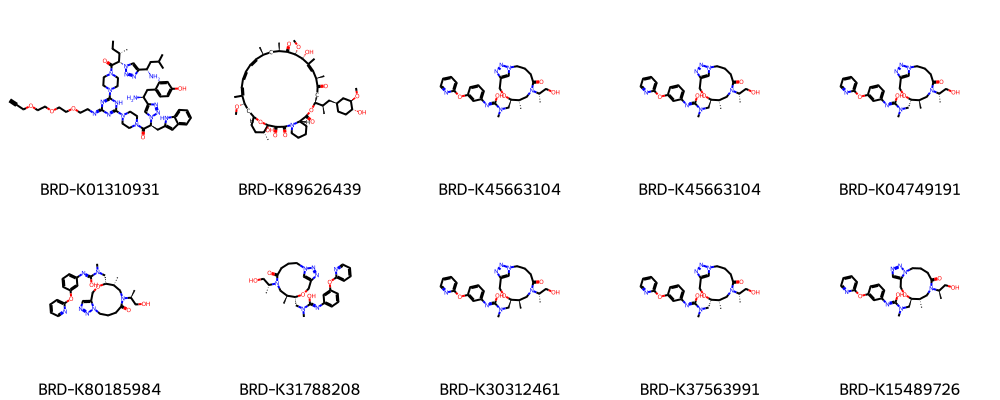

In [19]:
smiles_list =  furthest['STD_smile'].values[:10]
legends = list(furthest_20_morgan)
img = draw_molecules(smiles_list, legends)
img

2. Visualise closest molecule from structural point of view

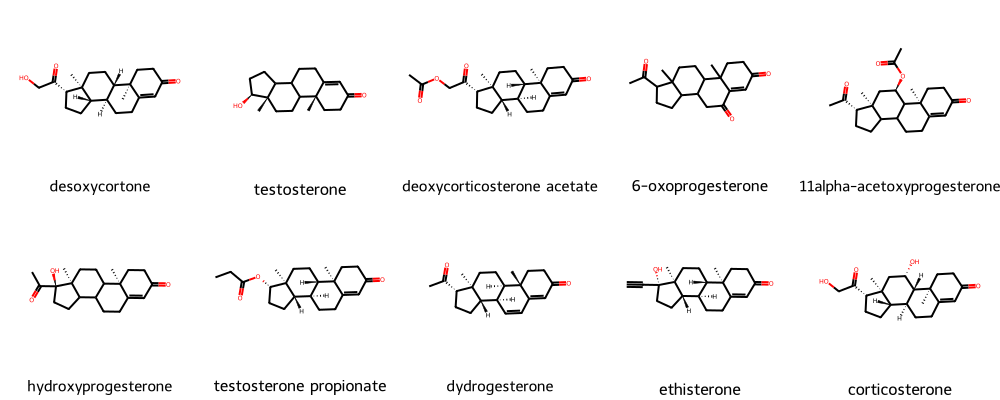

In [20]:
smiles_list =  closest['STD_smile'].values[1:11]
legends = list(closest_20_morgan)
img = draw_molecules(smiles_list, legends)
img

### On morphological fingerprint

> NB : the distance here is computed on the morphological fingerprint but we are showing in this part the molecule 

In [21]:
idx_ref = morgan_bin_ds[morgan_bin_ds['CPD_NAME'] == query_name].index.to_list()[0]

We convert all morphological features values as float

In [22]:
morph_fingerprint_cols = morgan_bin_ds.columns
for col in ['euclidean_distance_morganB_fps', 'morganB_fps', 'STD_smile', 'CPD_NAME', 'CPD_SMILES','Metadata_broad_sample']:
    index = np.argwhere(morph_fingerprint_cols==col)
    morph_fingerprint_cols = np.delete(morph_fingerprint_cols, index)

In [23]:
morgan_bin_ds['morphological_fingerprint'] = morgan_bin_ds.apply(lambda x: x[morph_fingerprint_cols].values.astype(np.float64), axis=1)

> A. Using Euclidean distance and morphological fingerprint features 

In [24]:
morgan_bin_ds = calculate_distances(dataframe=morgan_bin_ds, fingerprint_type='morphological_fingerprint', idx_ref=idx_ref)

In [25]:
furthest = morgan_bin_ds.sort_values('euclidean_distance_morphological_fingerprint', ascending=False)
furthest_20_morpholgical_fp = furthest['CPD_NAME'].values[:20]

The list of closest compounds will feature the query at position 0. We take into account positions 1-n to

In [26]:
closest = morgan_bin_ds.sort_values('euclidean_distance_morphological_fingerprint', ascending=True)
closest_20_morpholgical_fp = closest['CPD_NAME'].values[1:11]

1. Visualise furthest molecule from morphological point of view

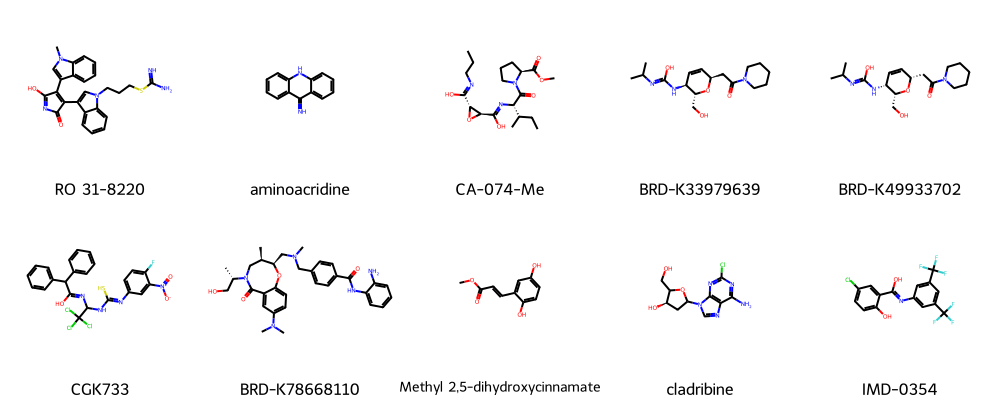

In [27]:
smiles_list =  furthest['STD_smile'].values[:10]
legends = list(furthest_20_morpholgical_fp)
img = draw_molecules(smiles_list, legends)
img


2. Visualise closest molecule from morphological point of view

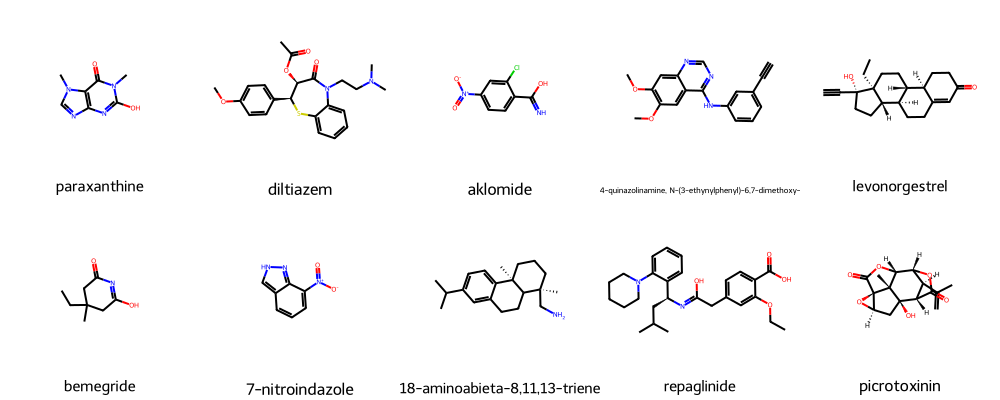

In [28]:
smiles_list =  closest['STD_smile'].values[1:11]
legends = list(closest_20_morpholgical_fp)
img = draw_molecules(smiles_list, legends)
img


### Pickle Fingerprint Dataframe

In [29]:
morgan_bin_ds.to_pickle('../data/fingerprint_ds.pkl')

### Morphological fingerprint representation 

The section above demonstrates how to find the closest molecule to a query based on Euclidean distance computed using either molecular fingerprints, such as Morgan fingerprints, or morphological fingerprints. The results were output as molecules. Here, we will quickly show the same results using morphological fingerprints by: i) overlapping the profile of our query with the closest and furthest matches, and ii) displaying the matches using a clustergram.

Overlaped profile 

In [30]:
query = morpho_profile[morpho_profile['CPD_NAME'] == query_name].head(1)
closest_query = morpho_profile[morpho_profile['CPD_NAME'] == closest_20_morpholgical_fp[0]].head(1)
furthest_query = morpho_profile[morpho_profile['CPD_NAME'] == furthest_20_morpholgical_fp[0]].head(1)

In [31]:
overlapped_profile = pd.concat([query,closest_query,furthest_query])

In [32]:
superimpo = overlapped_profile.iloc[:,3:].T
superimpo.columns = overlapped_profile['CPD_NAME'].to_list()

In [33]:
superimpo.corr()

,progesterone,paraxanthine,RO 31-8220
progesterone,1.000000,0.581327,-0.038447
paraxanthine,0.581327,1.000000,-0.003317
RO 31-8220,-0.038447,-0.003317,1.000000


In [34]:
# this features is drop for this case only because the value is too high and we can't visualise the profile)
superimpo.drop(labels='Cytoplasm_Texture_Entropy_DNA_5_0',axis=0,inplace=True)

In [35]:
# Super imposition of profiles
profiles_lines = px.line(superimpo , x=superimpo.index, y=superimpo.iloc[:,0],title="Profile superimposition ") 

profiles_lines.add_scatter(x=superimpo.index, y = superimpo.iloc[:,1])
profiles_lines.data[-1].name = superimpo.columns[1]

profiles_lines.add_scatter(x=superimpo.index, y = superimpo.iloc[:,2])
profiles_lines.data[-1].name = superimpo.columns[2]
profiles_lines.show()

Cluster map 

### Discussion on Fingerprint Similarity

We calculated the closest and furthest 20 compounds to the reference according to the euclidian distance between the respective compound fingerprint and the reference. This was done using two types of fingerprint, i.e., molecular (Morgan) and morphological fingerprint. Now, we want to see how the lists interesect.

In [36]:
print(f'{len(set(furthest_20_morgan).intersection(set(furthest_20_morpholgical_fp)))} compounds are in the list of the 20 furthest compounds according to both: morgan and morphological fingerprints.')
print(f'{len(set(closest_20_morgan).intersection(set(closest_20_morpholgical_fp)))} compounds are in the list of the 20 closest compounds according to both: morgan and morphological fingerprints.')

0 compounds are in the list of the 20 furthest compounds according to both: morgan and morphological fingerprints.
0 compounds are in the list of the 20 closest compounds according to both: morgan and morphological fingerprints.


It appears that neither list contains any shared compounds, suggesting that the Euclidean distance between fingerprints may not provide the definitive list of most similar compounds.<br>

The lack of cross-referenced information here may indicate complementary information for structure-activity or morphology-mechanism of action (MOA) relationships. <br>
Let's examine the overlap of the closest molecule profiles defined using Morgan fingerprints and then morphological fingerprints

In [37]:
'''
ref = sns.heatmap(df.iloc[idx_ref:idx_ref+1],cmap='coolwarm')
plt.gcf().set_size_inches(70,1)
fig = ref.get_figure()
'''


"\nref = sns.heatmap(df.iloc[idx_ref:idx_ref+1],cmap='coolwarm')\nplt.gcf().set_size_inches(70,1)\nfig = ref.get_figure()\n"

> overlaping profile code 

As shown in _text to add_ ,the molecule identified as the closest to our query showcase a similar linear structure however it's morphological profile ... <br>

Similarly the closest morphological profile to our query represent the molecule, which as rings and .. a tanimoto sim of ...


Information here does not cross , this could highlight complementary information for Structure - activity / Morphology - moa 